In [125]:
%matplotlib notebook
from copy import deepcopy as copy
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import scipy.io as sio
import pandas as pd
from tqdm import tqdm
import pickle
from collections import OrderedDict
import os
from scipy.ndimage.interpolation import shift
from functools import reduce
import time

from aux import Generic
from disp import set_font_size, get_spaced_colors
from ntwk import LIFNtwkG
from utils.general import *
from utils.file_io import *


In [126]:
def graph_weight_matrix(mat, title, v_max=None, ax=None, cmap='hot'):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(4, 4), tight_layout=True)
    else:
        ax.clear()
    ax.matshow(mat, vmin=0, vmax=v_max if v_max is not None else mat.max(), cmap=cmap) # 'gist_stern'
    ax.set_title(title)
#     ax.set_xlim(0, 100)
#     ax.set_ylim(100, 0)
    set_font_size(ax, 14)

In [127]:
def load_exp_data(direc, cut=None, layer_size=20, row_min=0, row_max=None, col_min=0, col_max=None):
    file_names = [f for f in sorted(all_files_from_dir(direc))]
    if cut is not None:
        file_names = file_names[:cut]
        
    df = pd.DataFrame({})
    
    for i_f in range(0, len(file_names)):
        file = file_names[i_f]
        loaded = sio.loadmat(os.path.join(direc, file))
        
        first_spk_times = loaded['first_spk_times'][0]
        w_r_e = loaded['w_r_e']
        
        if row_max is None:
            row_max = w_r_e.shape[0]
        if col_max is None:
            col_max = w_r_e.shape[1]
        target_w_r_e = w_r_e[row_min:row_max, col_min:col_max]
        
        summed_incoming_weights = target_w_r_e.sum(axis=1)
        
        last_layer_active = 0
        layer_weights = []
        
        for i in range(0, len(first_spk_times), layer_size):
            layer_active = np.any(~np.isnan(first_spk_times[i:i+layer_size]))
            if layer_active:
                last_layer_active = i/layer_size
        
            layer_weight = np.sum(summed_incoming_weights[i:(i + layer_size)])
            layer_weights.append(layer_weight)
        
        df = df.append({
            'index': i_f,
            'last_layer_active': last_layer_active,
            'first_spk_times': first_spk_times,
            'layer_weights': layer_weights,
            'mean_incoming_summed_weights': np.mean(summed_incoming_weights),
            'std_incoming_summed_weights': np.std(summed_incoming_weights),
        }, ignore_index=True)
    
    return df

In [136]:
all_dirs = filter_list_by_name_frags(all_in_dir('./robustness'), ['noise_ff_0.2_pf_0.7_pr_0.0_eir_2.0_ier_0.3'])

<IPython.core.display.Javascript object>


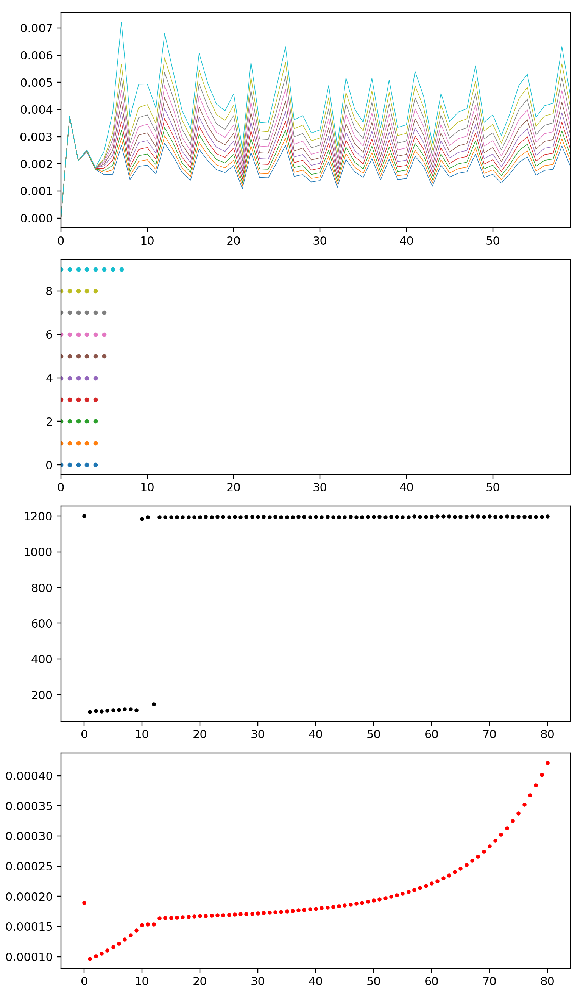

719400
5548
5974
5754
6200
6521
6657
7172
7172
6521
715878
717784
11543
717906
717311
717906
717906
717906
717906
717906
717906
717990
717311
718073
718073
717906
717478
717906
718073
718073
717478
718073
717906
717990
717311
717906
717906
718073
717990
717906
718073
717906
718073
717906
717906
717906
718073
717247
717906
717414
717478
718073
717906
718073
718073
717906
717906
718494
718327
718073
718327
718494
718494
718494
718327
718068
718234
718494
718494
718234
718494
718234
718318
718494
718068
718318
717892
718068
718068
718068
718494


<IPython.core.display.Javascript object>


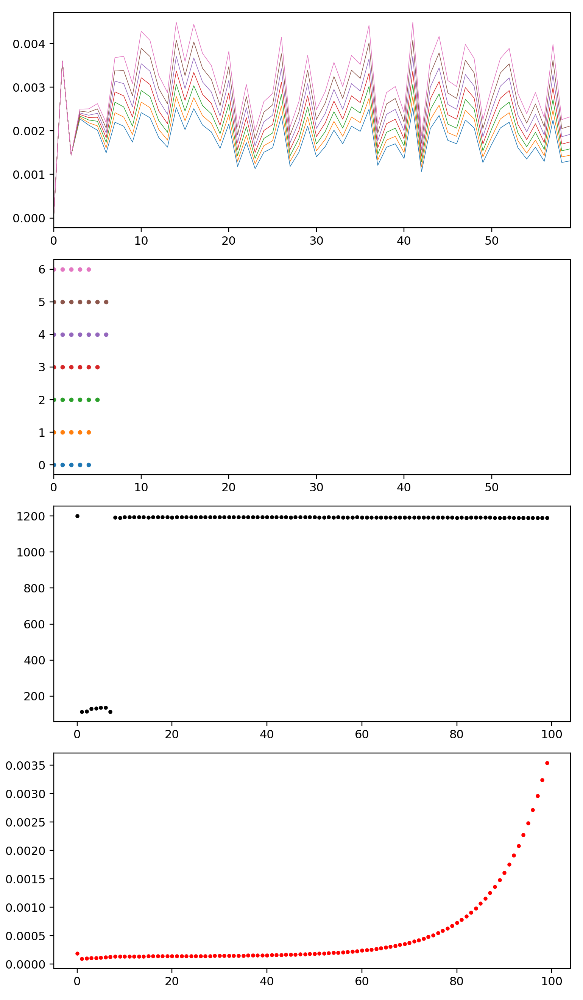

719400
6404
6699
8455
8706
9310
9310
6533
715800
715606
715931
715931
715931
715931
715931
715081
715931
715931
715931
715931
715081
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715931
715081
715931
715931
715931
715931
715931
715746
715081
715931
715746
715931
715746
715746
715746
715931
714896
715746
715746
715746
715746
715746
714896
714896
715746
714896
714896
714896
714896
714896
714896
714896
714896
714896
714896
714896
713958
714896
713958
714896
714896
714896
714896
714896
713958
713958
713958
714896
713958
713958
713958
713958
713958
713958
713958
713827


<IPython.core.display.Javascript object>


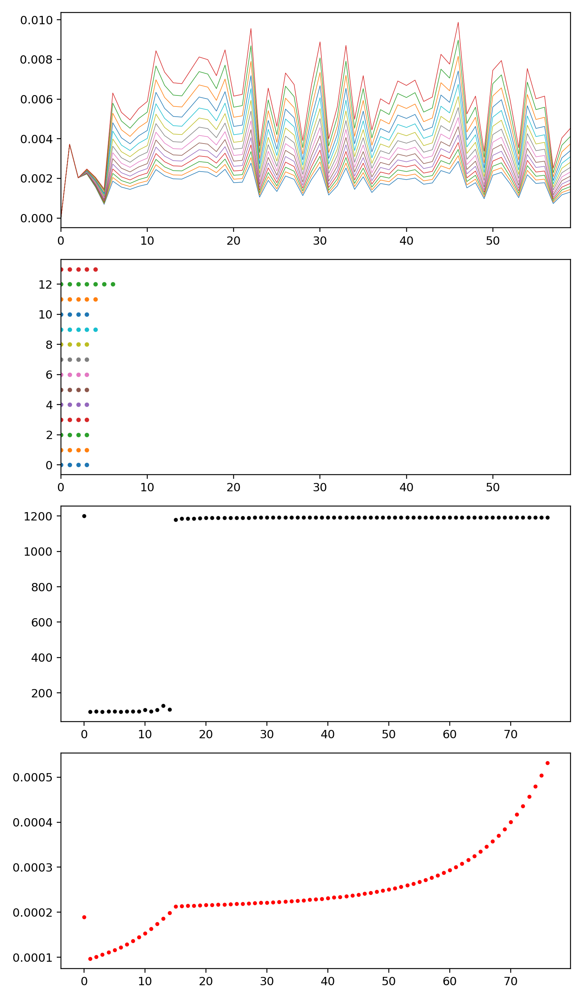

719400
4424
4511
4326
4597
4597
4326
4597
4597
4597
5315
4597
5315
8527
5533
713413
714225
714225
714225
714447
714669
714873
714669
714873
714669
714873
714873
714873
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957
714957


<IPython.core.display.Javascript object>


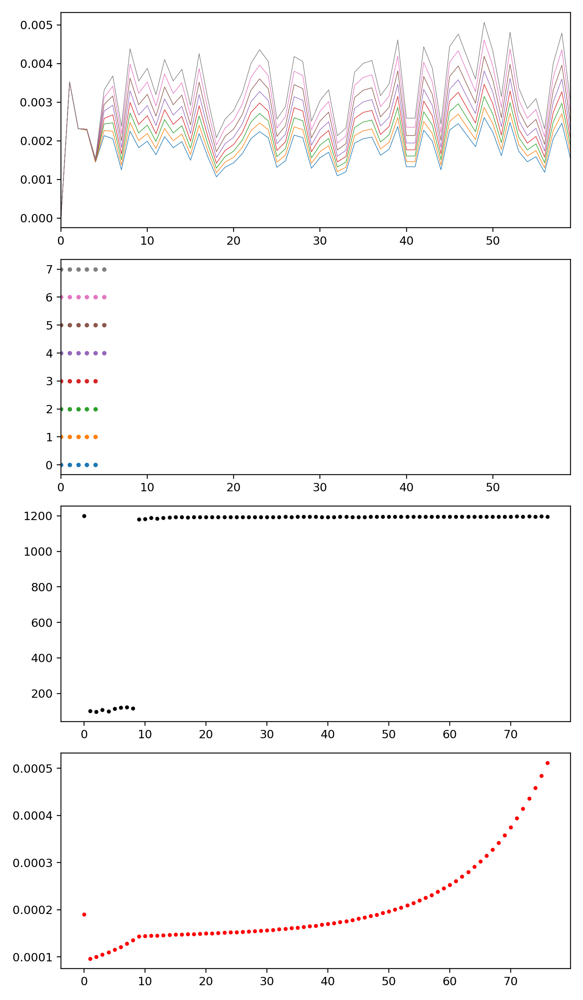

719297
5269
4750
5934
5066
6859
7420
7804
7107
714767
715014
716043
715472
715996
716179
716351
716465
716263
716465
716465
716465
716465
716465
716465
716465
716465
716465
716465
716465
716377
716377
716465
716377
716554
716377
716554
716554
716554
716554
716466
716466
716466
716554
716554
716466
716466
716466
716554
716554
716554
716554
716554
716554
716554
716554
716554
716554
716554
716554
717224
716554
716554
716554
716554
716554
717224
717224
717224
716554
717224
716653
717323
716653
717323
716653
717323
716653


<IPython.core.display.Javascript object>


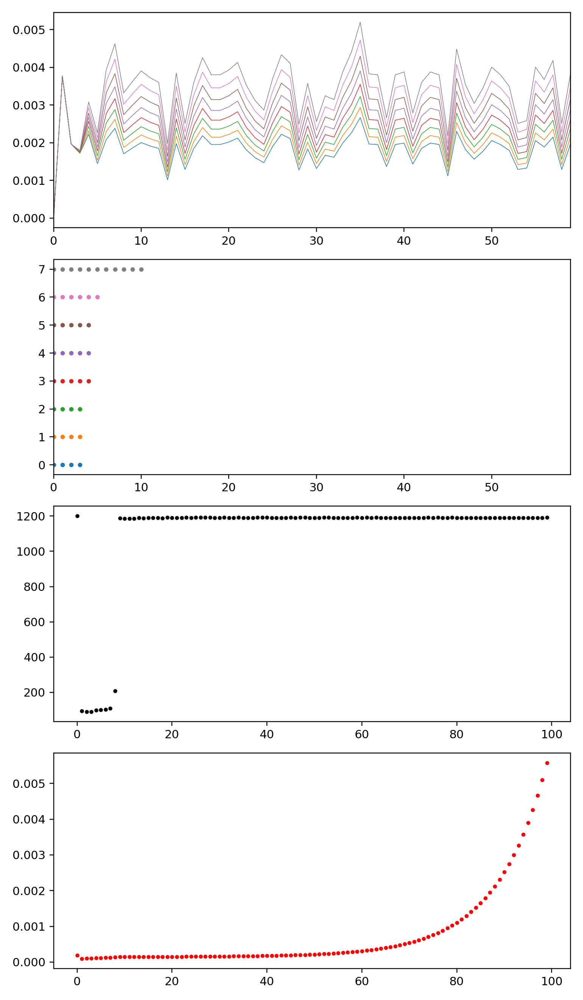

719400
4575
4135
4233
4908
5133
5353
6265
22876
713137
713714
713444
711995
712965
712899
712888
713062
712888
713748
714879
712251
713062
713332
714068
713969
714419
715155
714245
715326
713068
713338
714885
713338
713338
715059
713975
713338
713338
715326
714245
714248
713068
713068
713338
713681
715326
713338
714248
715155
713338
713338
713277
714245
713951
713338
713975
713338
713087
713068
714245
713785
714294
713384
714984
713194
712878
713785
713464
714055
712878
712878
712878
712878
713194
714077
712878
714077
712878
713785
715011
712878
713464
713194
713194
713194
714101
713807
713194
713194
713194
713194
713807
713194
712878
713194
713194
713194
713194
713194
715011


<IPython.core.display.Javascript object>


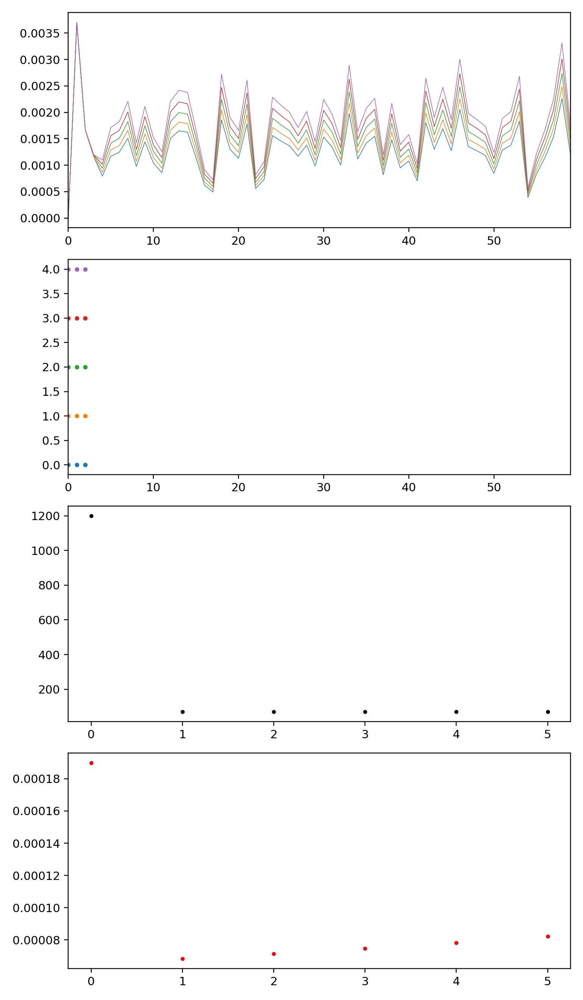

718442
2482
2482
2482
2554
2482


<IPython.core.display.Javascript object>


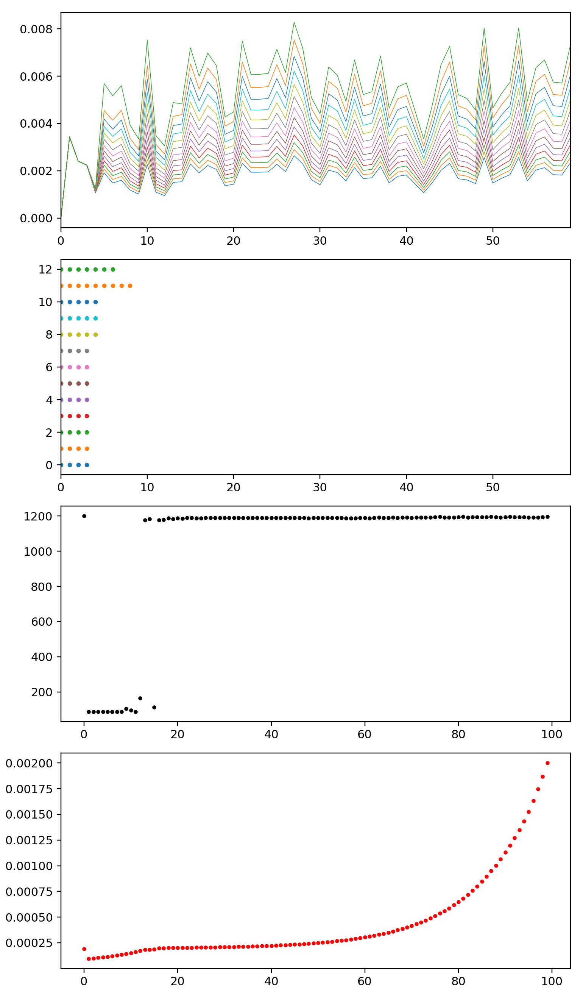

719400
3809
3902
3902
3902
3902
3809
3809
3809
5714
4803
3916
14533
714620
714508
6997
714621
714814
714909
714616
714909
714816
715814
715732
714909
715639
715701
715900
715900
715900
715701
715608
715701
715900
715900
716020
716020
716020
716020
716113
716020
716020
716020
716113
715858
715612
715608
715765
715353
715765
715765
715765
716113
715946
715765
715244
715519
714905
715519
715765
715765
715151
715765
716030
715239
715853
716030
715416
716285
716030
715416
716030
716285
716030
716285
715677
716546
716285
716030
716285
716291
716546
715752
716366
716366
715932
716366
716546
716366
715752
715932
716546
716461
716366
715932
715752
715752
715752
715932
716546


<IPython.core.display.Javascript object>


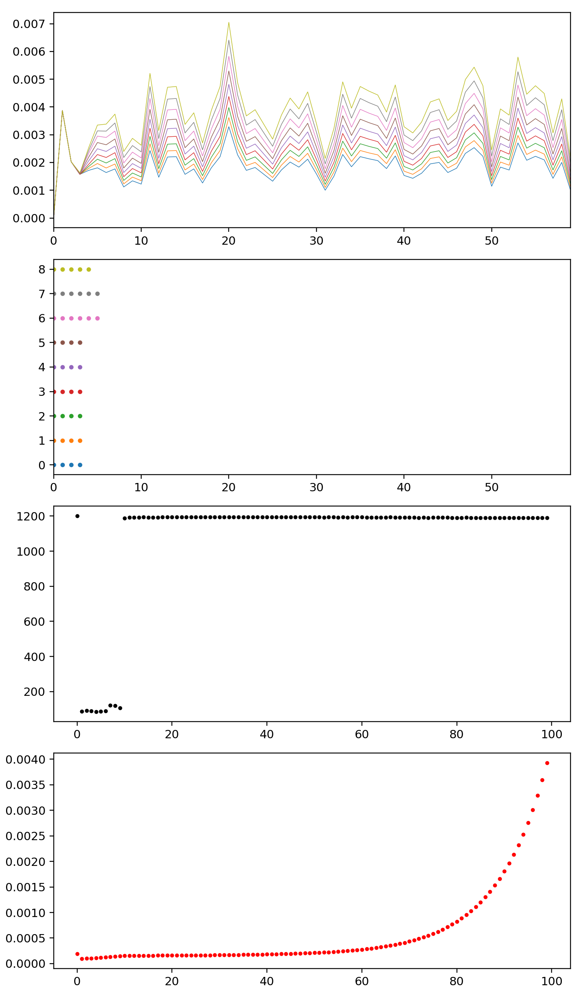

719400
3791
4133
4046
3608
3791
4046
7554
7255
5817
714009
714697
714697
714697
715337
714395
715238
715092
715337
715849
715422
715177
715177
715177
715177
715177
715177
715177
715177
715177
715177
715177
714979
715822
715822
715822
715822
715822
715177
715340
715822
715340
715822
715822
715822
715822
714979
715636
715822
715822
715636
715636
715154
715636
715636
714538
715636
714538
715636
715636
715636
714793
714899
715154
715154
714793
715636
715154
714793
714793
714793
714899
713278
714311
713866
714311
714311
715154
714121
714683
713650
713023
714348
712807
713905
713650
712807
713062
714095
713905
713905
713905
713650
713905
713062
713062
714095
713062
713905
713650


<IPython.core.display.Javascript object>


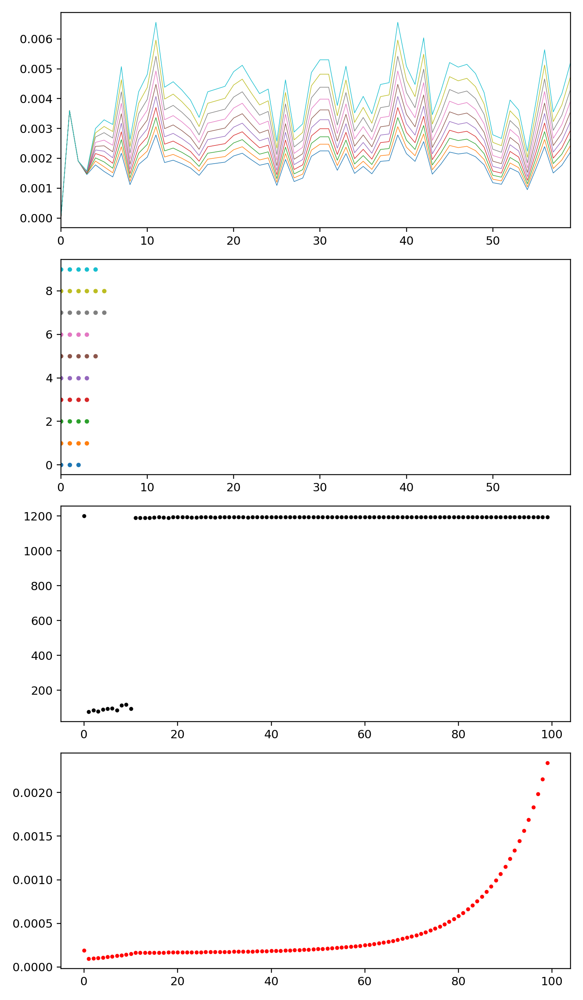

719400
2946
3744
3200
4086
4445
4640
3744
6792
7150
4514
713414
714359
715090
715090
715187
715691
715541
714421
715691
715691
715691
715691
715613
715613
715691
715691
715691
715613
715691
715691
715691
715691
715755
715755
714635
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715755
715594
715755
715755
715755
715755
715755
715755
715755
715755
715755
715594
715594
715594
715594
715755
715594
715594
715594
715755
715755
715755
715594
715755
715594
715594
715755
715594
715594
715755
715594
715594
715755
715594
715594
715594
715594


<IPython.core.display.Javascript object>


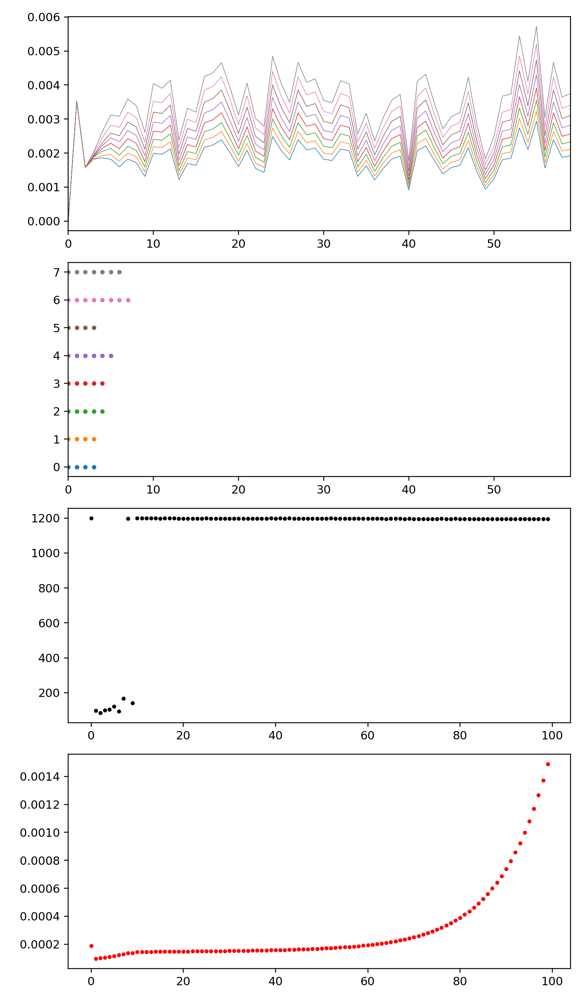

719400
4689
3630
4915
5568
7366
4323
14445
717407
10386
717718
717718
717718
717718
717718
717448
717718
717718
717718
717448
717261
718132
717531
717531
717531
718402
717531
717531
717531
717531
717531
716632
716632
717531
717531
716632
717531
717531
717531
718402
717531
718402
717531
718402
716632
716632
716632
717531
717531
717531
717531
717531
718402
716632
716632
716632
716632
716632
717531
717531
716632
717531
716632
716632
716362
716632
717531
716632
716436
716632
716436
716436
716436
716436
716436
716362
717503
716436
716436
716632
716436
716436
716436
716436
716436
716436
716436
716362
716436
716436
716362
716436
716436
716166
716166
716436
716166
716362
716362
716436


<IPython.core.display.Javascript object>


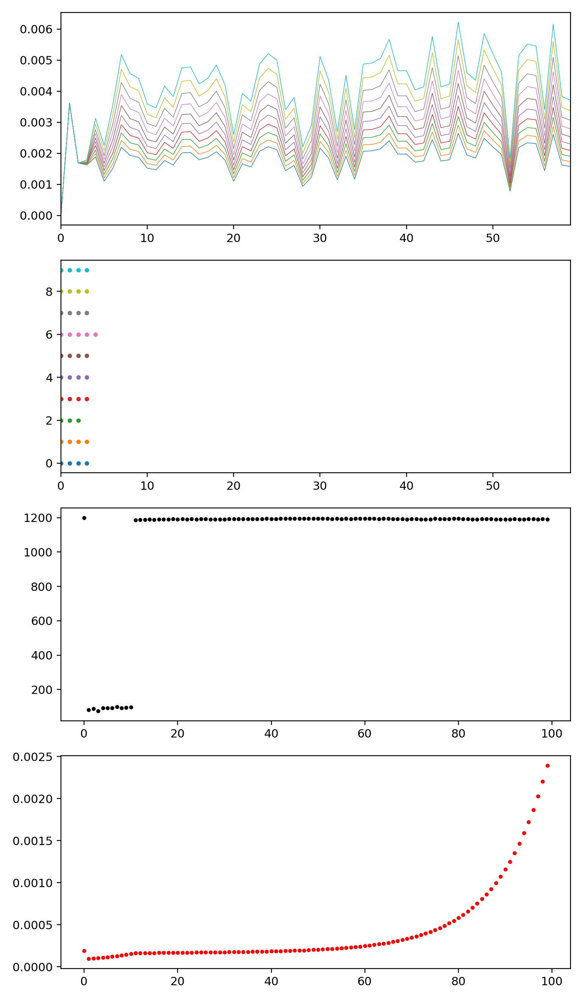

719400
3320
3939
2802
4298
4298
4298
4981
4395
4491
4662
715018
715554
715554
715691
715434
715691
715793
715665
715735
715665
715735
715665
715735
715665
715735
715735
715665
715665
715665
715665
715809
715735
715809
715809
715809
715809
715809
715809
715871
715809
715809
715871
715871
715871
715871
715871
715871
715871
715871
715871
715871
715871
715608
715871
715608
715871
715608
715871
715871
715871
715871
715871
715608
715871
715871
715179
715179
715374
714328
715179
715179
714328
714328
714682
715871
715179
715179
715374
715871
715871
714133
715179
714682
714682
715179
715637
715179
714682
713636
714682
714682
714133
713636
714682
715374
715179
714682
715374
714682


<IPython.core.display.Javascript object>


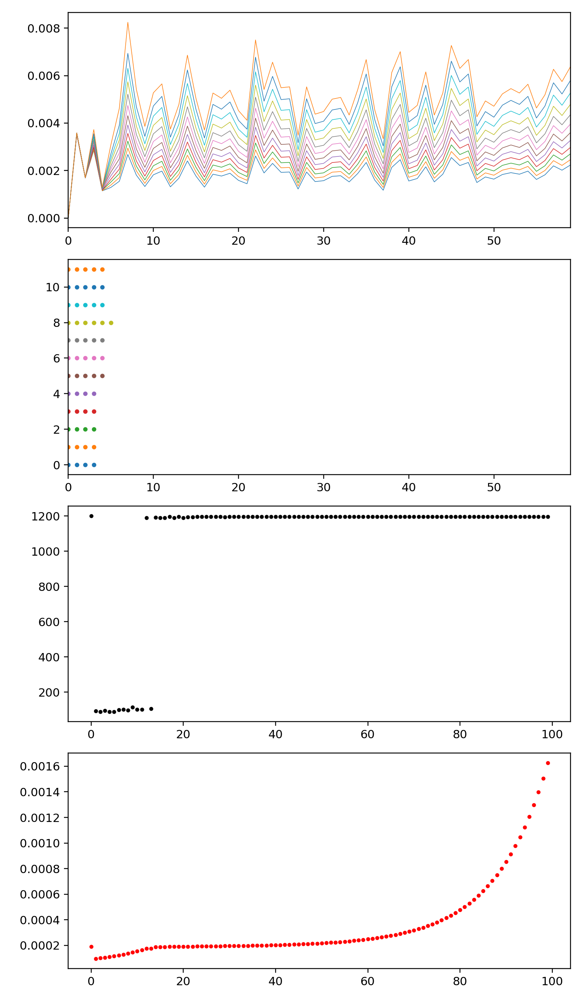

719400
4311
3968
4498
3968
4048
5041
5391
4703
6758
5156
5391
716311
5829
716501
716411
715855
716863
716311
716863
715855
716307
716210
716863
716863
716863
716863
716863
716863
716307
716863
716863
716421
716977
716977
716977
716421
716977
716421
716977
716977
716421
716977
716421
716977
716977
716421
716421
716977
716421
716977
716977
716421
716421
716977
716421
716421
716421
716421
716421
716977
716421
716977
716421
716421
716421
716421
716421
716977
716421
716977
716421
716421
716421
716421
716421
716421
716977
716421
716421
716421
716421
716421
716421
716421
716421
716421
716421
716421
716421
716421
716977
716421
716421
716977
716421
716421
716421
716421
716421


<IPython.core.display.Javascript object>


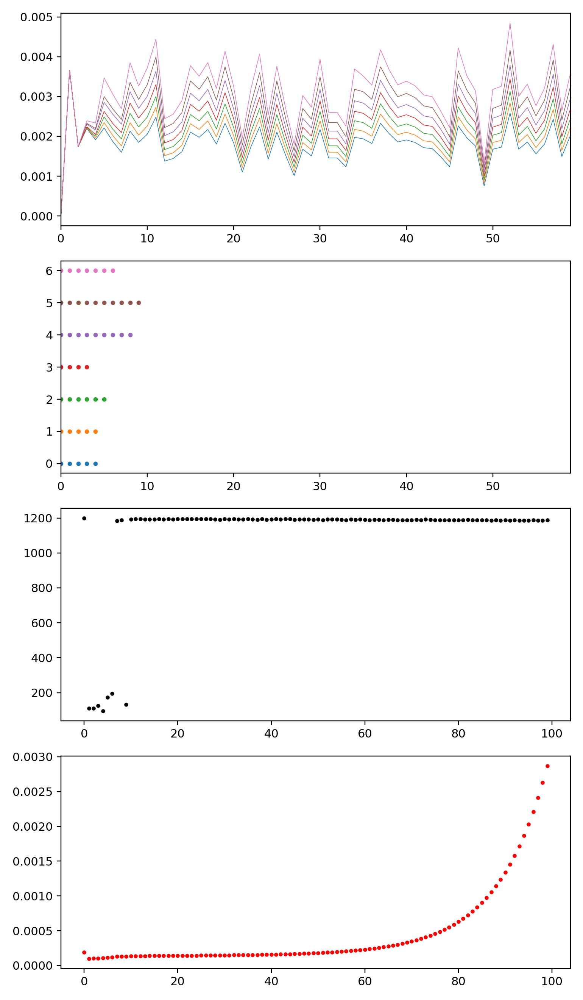

719263
6100
6100
7974
4468
15323
19586
710315
712425
8924
716322
716852
716852
716175
716175
716175
716271
716175
716271
715721
716604
716271
716271
716271
716271
716271
716271
716770
715845
712871
716271
715273
716770
714741
715721
716770
714242
712747
716271
713745
715721
716770
715721
716770
715772
713297
714849
716154
715721
713867
714226
712630
714776
714796
715346
714178
712630
714798
712820
714796
712820
712630
713816
712820
712071
713610
713626
712630
712071
712071
712630
712820
712071
715604
713056
712261
712071
712071
712071
712071
712071
712630
712820
712071
712071
712071
712071
711914
712261
711914
712473
711914
712071
711914
711914
711914
712071
711914
711914
712071


<IPython.core.display.Javascript object>


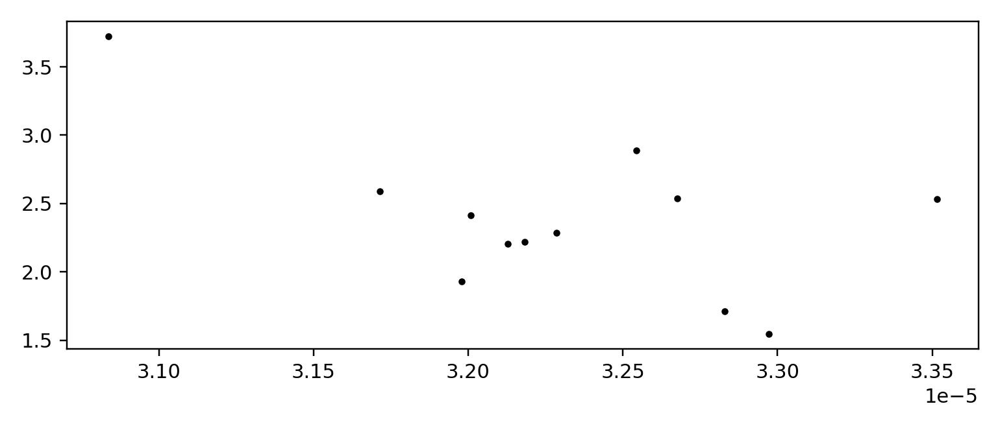

13


In [137]:
num_layers = 59
count = 0
all_std_incoming_summed_weights_perturbed = []
ratios_of_mean_incoming_summed_weights = []

for exp_dir_name in all_dirs:
    count += 1
    fig, ax = plt.subplots(4, 1, figsize=(7, 12), tight_layout=True)
    exp_data = load_exp_data(os.path.join('./robustness', exp_dir_name), cut=100)
    
    std_incoming_summed_weights_perturbed = exp_data['std_incoming_summed_weights'].iloc[1]
    
    last_failed_trial = 0
    
    failing_trials = exp_data[exp_data['last_layer_active'] < num_layers]
    for i_trial in range(len(failing_trials)):
        layer_weights = failing_trials['layer_weights'].iloc[i_trial]
        ax[0].plot(np.arange(len(layer_weights)), layer_weights, lw=0.5)
        
        last_layer_active = failing_trials['last_layer_active'].iloc[i_trial]
        ax[1].scatter(np.arange(int(last_layer_active)), i_trial * np.ones(int(last_layer_active)), s=8)
        
        trial_index = failing_trials['index'].iloc[i_trial]
        if trial_index > last_failed_trial:
            last_failed_trial = trial_index
    
    try:
        initial_mean_incoming_summed_weights = np.mean(exp_data['mean_incoming_summed_weights'].iloc[0])
        recovered_mean_incoming_summed_weights = np.mean(exp_data['mean_incoming_summed_weights'].iloc[74])

        ratios_of_mean_incoming_summed_weights.append(recovered_mean_incoming_summed_weights / initial_mean_incoming_summed_weights)
        
        all_std_incoming_summed_weights_perturbed.append(std_incoming_summed_weights_perturbed)
    except IndexError as e:
        pass
    
    for i_trial in range(len(exp_data)):
        ax[2].scatter([i_trial], [np.sum(np.where(~np.isnan(exp_data['first_spk_times'].iloc[i_trial]), 1, 0))], c='black', s=6)
        ax[3].scatter([i_trial], [exp_data['mean_incoming_summed_weights'].iloc[i_trial]], c='red', s=6)
        print(np.sum(np.where(~np.isnan(exp_data['first_spk_times'].iloc[i_trial]))))
        
    for i in range(2):
        ax[i].set_xlim(0, num_layers)

fig, ax = plt.subplots(1, 1, figsize=(7, 3), tight_layout=True)
ax.scatter(all_std_incoming_summed_weights_perturbed, ratios_of_mean_incoming_summed_weights, s=6, c='black')
    
print(count)

In [107]:
def plot_w_r(w_r, row_min=0, row_max=None, col_min=0, col_max=None, layer_size=20):
    if row_max is None:
        row_max = w_r.shape[0]
    if col_max is None:
        col_max = w_r.shape[1]
    target_w_r = w_r[row_min:row_max, col_min:col_max]
    
    graph_weight_matrix(target_w_r, '', v_max=None, cmap='hot')
    
    incoming_weights = target_w_r.sum(axis=1)
    fig, ax = plt.subplots(4, 1, figsize=(7, 12), tight_layout=True)
    ax[0].scatter(np.arange(len(incoming_weights)), incoming_weights, s=3)
    ax[0].set_ylabel('Summed Incoming Synapse Strength')
    
    print(f'average summed incoming weight per cell: {np.mean(incoming_weights)} +/- {np.std(incoming_weights)}')

    thresh = 1e-7
    thresholded = np.where(target_w_r > thresh, 1, 0)
    thresholded_target_w_r = np.where(thresholded, target_w_r, np.nan)
    counts = np.count_nonzero(thresholded, axis=1)
    print(f'average incoming connections per cell: {np.mean(counts)} +/- {np.std(counts)}')

    ax[1].fill_between(x=np.arange(len(incoming_weights)),
                   y1=np.nanmean(thresholded_target_w_r, axis=1) - np.nanstd(thresholded_target_w_r, axis=1)/np.sqrt(counts),
                   y2=np.nanmean(thresholded_target_w_r, axis=1) + np.nanstd(thresholded_target_w_r, axis=1)/np.sqrt(counts),
                    color='red', alpha=0.2)

    ax[1].scatter(np.arange(len(incoming_weights)), np.nanmean(thresholded_target_w_r, axis=1), s=1, c='red')  
    
    ax[1].set_ylabel('Incoming Individual Synapse Strength')

    ax[2].scatter(np.arange(len(counts)), counts, c='red', s=3)
    ax[2].set_xlabel('Neuron Idx')
    ax[2].set_ylabel('Num Connections over Threshold')
    
    total_weight_per_layer = []
    for layer_start in range(0, target_w_r.shape[0], layer_size):
        layer_weight = np.sum(incoming_weights[layer_start:(layer_start + layer_size)])
        ax[3].scatter([layer_start/layer_size], [layer_weight], c='black', s=6)